# About this project

This codebook creates interactive HTML maps of the distribution of grocers across the city of Atlanta using Open Street Map data as the basis for grocers.

It produces visualizations for distribution by
- Neighborhood Planning Units (NPUs)
- City Council Districts
- City Quadrants

Some day soon, I will come back and set up a hyperlinked table of contents and also include the code I used to create static visualizations of this information as well, which included maps, histograms, and treemaps.

# 0 Set Up

## 0.1 Package Imports

In [4]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
import osmnx as ox
import pandas as pd
import folium
import os
import html2image
import squarify
import textwrap
import matplotlib.cm as cm
import matplotlib.colors as mcolors

from shapely.geometry import Polygon, Point
from folium import Choropleth
from branca.colormap import linear
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
from IPython.display import display, HTML
from matplotlib import rcParams
from matplotlib import font_manager
from shapely.affinity import translate
from folium import MacroElement
from branca.element import Element

## 0.2 Global Font Setting for Visualizations

In [6]:
# Define the path to Arimo font
arimo_font_path = r"C:\Users\Daniel\AppData\Local\Microsoft\Windows\Fonts\Arimo-VariableFont_wght.ttf"

# Ensure the file exists
if os.path.exists(arimo_font_path):
    print("Font file exists.")

# Add the font manually
font_manager.fontManager.addfont(arimo_font_path)

# Check if the font is now available
arimo_fonts = [f.name for f in font_manager.fontManager.ttflist if "Arimo" in f.name]
print(arimo_fonts)  # Should now list 'Arimo'

Font file exists.
['Arimo']


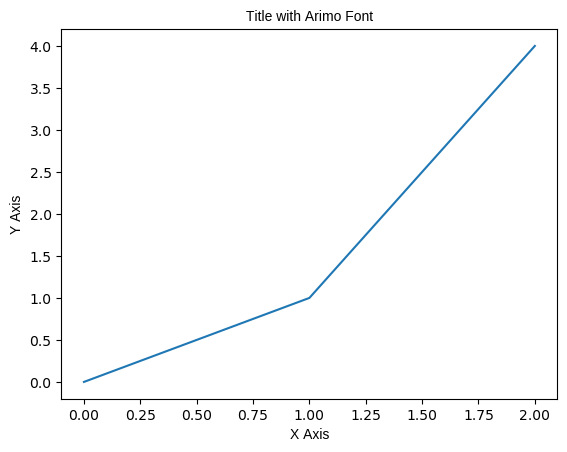

In [7]:
# Load Arimo font manually
arimo_font = font_manager.FontProperties(fname=arimo_font_path)

# Plot using Arimo
fig, ax = plt.subplots()
ax.plot([0, 1, 2], [0, 1, 4])
ax.set_title("Title with Arimo Font", fontproperties=arimo_font)
ax.set_xlabel("X Axis", fontproperties=arimo_font)
ax.set_ylabel("Y Axis", fontproperties=arimo_font)

plt.show()

In [8]:
# Set Arimo as the global default font
rcParams['font.family'] = 'Arimo'

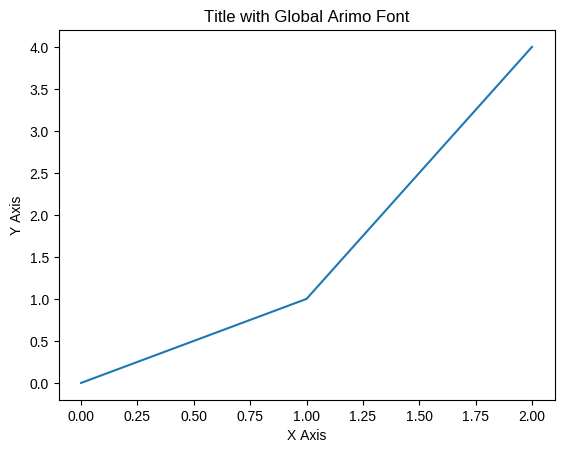

In [9]:
# Example plot to verify global font setting
fig, ax = plt.subplots()
ax.plot([0, 1, 2], [0, 1, 4])
ax.set_title("Title with Global Arimo Font")
ax.set_xlabel("X Axis")
ax.set_ylabel("Y Axis")

plt.show()

# 1. Key Variables

## 1.2 Import ATL City Limits

City Boundary CRS: epsg:4326


C:\Users\Daniel\AppData\Local\Temp\ipykernel_170888\1595040654.py:12: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  city_boundary.to_file(output_shapefile, driver="ESRI Shapefile")


City boundary saved as shapefile: atlanta_city_boundary.shp


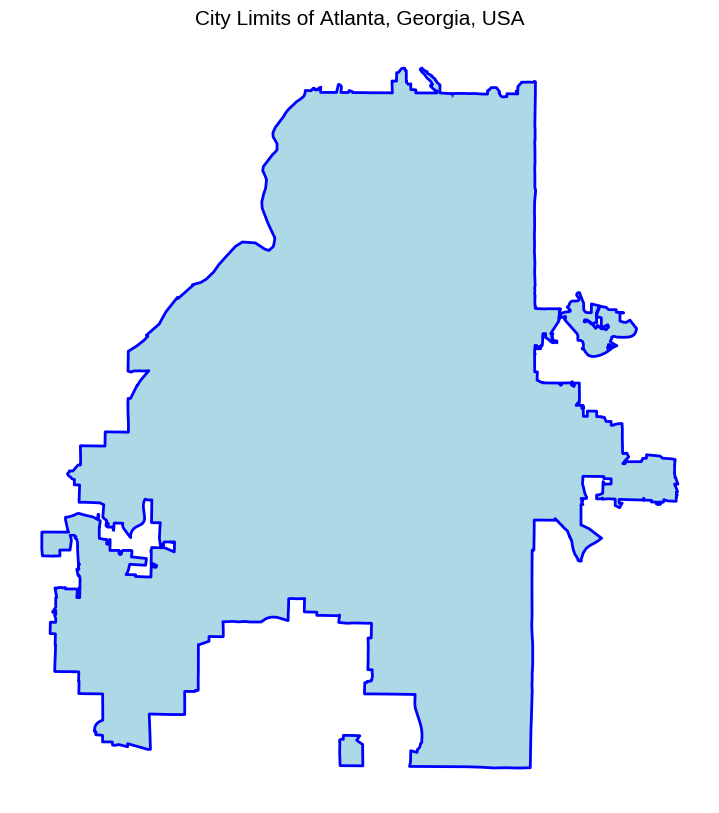

In [12]:
# Specify the place name
place_name = "Atlanta, Georgia, USA"

# Get the boundary of the city
city_boundary = ox.geocode_to_gdf(place_name)

# Check and print the CRS of the city boundary
print(f"City Boundary CRS: {city_boundary.crs}")

# Save the city boundary as a shapefile
output_shapefile = "atlanta_city_boundary.shp"
city_boundary.to_file(output_shapefile, driver="ESRI Shapefile")
print(f"City boundary saved as shapefile: {output_shapefile}")

# Plot the boundary
fig, ax = plt.subplots(figsize=(10, 10))
city_boundary.plot(ax=ax, color='lightblue', edgecolor='blue', linewidth=2)
ax.set_title(f"City Limits of {place_name}", fontsize=15)
plt.axis("off")
plt.show()

## 1.2 Pull Grocery Stores List within ATL

In [14]:
# Define tags for stores
#OLD store_tags = {
#    'shop': ['supermarket', 'department_store', 'greengrocer', 'convenience', 'food', 'health_food', 'wholesale', 'farm'],
#    'amenity': ['marketplace'],
#    'building': ['supermarket']
#}

store_tags = {
    'shop': ['supermarket', 'department_store', 'greengrocer', 'convenience', 'food', 'health_food', 'wholesale', 'farm'],
    'amenity': ['supermarket', 'marketplace'],
    'building': ['supermarket', 'retail']
}

# Get supermarkets and department stores within the boundary
stores = ox.geometries_from_place(place_name, tags=store_tags)

# Check if stores data has returned successfully
if stores.empty:
    print("No stores found in the queried area.")
else:
    # Convert polygons to points (centroids) and keep original points
    stores['geometry'] = stores.geometry.apply(lambda geom: geom.centroid if geom.type == 'Polygon' else geom)

    # Retrieve and print unique store names
    unique_store_names = stores['name'].dropna().unique()  # Drop NaN values to avoid issues with missing names
    print("Unique Store Names:", unique_store_names)

C:\Users\Daniel\AppData\Local\Temp\ipykernel_170888\3034231833.py:15: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  stores = ox.geometries_from_place(place_name, tags=store_tags)


Unique Store Names: ["Trader Joe's" 'TJ Maxx' 'Candler Park Market'
 'Definition6 Interactive Marketing' 'Publix' 'Sweet Auburn Grocery' 'BP'
 'Fiesta Food Market' "East Atlanta Farmer's Market" 'Kroger'
 'Capital City Realty' 'Public Storage' 'Grant Park Farmers Market'
 'Chevron' 'BP Shop' 'Whole Foods Market' 'Target' 'Fair Street Superette'
 'Southern Supermarket' 'Neiman Marcus' "Macy's" 'Peachtree Food Mart'
 'J & C Food Mart' 'Quick Pick Convenience Store' 'Green Market' 'Ross'
 'Earth Fare' 'Sprouts Farmers Market' 'American Deli' 'Grant Park Market'
 'Savi Provisions - MStreet' 'Best 4 Less' 'Piggly Wiggly' 'Marshalls'
 'ALDI' "Sean's Harvest Market" "Burdell's" 'Evergreen Butcher & Baker'
 'Nordstrom' 'Food Mart' 'Impact Window Tinting' 'Stop N Save'
 'Express Food & Pharmacy' 'Dixie News' 'Quik Mart' 'Ponce Mini Market'
 'Circle K' '710 Peachtree Grocery' 'The Varsity'
 'Atlanta Municipal Market' 'The Dump' 'Lenox Square'
 'AmericasMart Atlanta' 'The Home Depot' 'Morningside

C:\Users\Daniel\AppData\Local\Temp\ipykernel_170888\3034231833.py:22: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  stores['geometry'] = stores.geometry.apply(lambda geom: geom.centroid if geom.type == 'Polygon' else geom)


## 1.3 Identify and Exclude Non-Grocery Stores from Above

In [16]:
store_tags = {
    'shop': ['supermarket', 'department_store', 'greengrocer', 'convenience', 'food', 'health_food', 'wholesale', 'farm'],
    'amenity': ['supermarket', 'marketplace'],
    'building': ['supermarket', 'retail']
}

# Get supermarkets and department stores within the boundary
stores = ox.geometries_from_place(place_name, tags=store_tags)

# Check if stores data has returned successfully
if stores.empty:
    print("No stores found in the queried area.")
else:
    # Convert polygons to points (centroids) and keep original points
    stores['geometry'] = stores.geometry.apply(lambda geom: geom.centroid if geom.type == 'Polygon' else geom)

    # Define a list of store names to exclude
    exclude_stores = ['TJ Maxx', 'Definition6 Interactive Marketing', 'BP',
                      'Capital City Realty', 'Public Storage', 'Chevron',
                      'BP Shop', 'QuikTrip', 'Neiman Marcus', "Macy's",
                      'Quick Pick Convenience Store', 'Ross', 'Atlanta Pharmacy',
                      'American Deli', 'Marshalls', 'Nordstrom', 'Impact Window Tinting',
                      'Circle K', 'AmericasMart Atlanta', 'Texaco', 'Saks Fifth Avenue',
                      'RaceTrac', '76 Gas Express', "Bloomingdale's", 'Earth Fare',
                      "Sean's Harvest Market", "Shopper's World", 'Fair Street Superette',
                      'Southern Supermarket', 'Peachtree Food Mart', 'J & C Food Mart',
                      'Green Market', 'Best 4 Less', 'Ponce Mini Market', "Burdell's",
                      'Food Mart', 'Stop N Save', 'Express Food & Pharmacy', 'Dixie News', 'Quik Mart',
                      'Metro Quik Mart', 'Convenient Food Mart', 'Morningside Farmers Market',
                      "East Atlanta Farmer's Market", 'Grant Park Farmers Market', 'Auburn Discount Grocery',\
                      'Evergreen Butcher & Baker', '710 Peachtree Grocery', 'Sweet Auburn Grocery']

    # Exclude unwanted stores
    subset_stores = stores[~stores['name'].isin(exclude_stores)]

    # Include stores with relevant categories in any column
    subset_stores = subset_stores[
        (subset_stores['shop'].isin(['supermarket', 'department_store', 'greengrocer', 'convenience', 'food', 'health_food', 'wholesale', 'farm'])) |
        (subset_stores['amenity'].isin(['marketplace'])) |
        (subset_stores['building'].isin(['supermarket']))
    ]

    # Exclude stores with blank or null names
    subset_stores = subset_stores[subset_stores['name'].notnull()]  # Exclude null names
    subset_stores = subset_stores[subset_stores['name'].str.strip() != '']  # Exclude empty names

    # Retrieve and print unique store names from the refined subset
    unique_store_names_subset = subset_stores['name'].dropna().unique()
    print("Filtered Unique Store Names:", unique_store_names_subset)

    # Convert columns with invalid types to strings
    for col in subset_stores.columns:
        if subset_stores[col].dtype == 'object':  # Object type might include lists or other invalid types
            # Convert lists or other non-scalar objects to strings
            subset_stores[col] = subset_stores[col].apply(lambda x: str(x) if isinstance(x, list) else x)

    # Export the refined subset as a shapefile
    output_shapefile = "filtered_subset_stores.shp"
    subset_stores.to_file(output_shapefile, driver="ESRI Shapefile")
    print(f"Filtered subset of stores saved as shapefile: {output_shapefile}")

C:\Users\Daniel\AppData\Local\Temp\ipykernel_170888\3966355186.py:8: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  stores = ox.geometries_from_place(place_name, tags=store_tags)


Filtered Unique Store Names: ["Trader Joe's" 'Candler Park Market' 'Publix' 'Fiesta Food Market'
 'Kroger' 'Whole Foods Market' 'Target' 'Sprouts Farmers Market'
 'Grant Park Market' 'Savi Provisions - MStreet' 'Piggly Wiggly' 'ALDI'
 'Atlanta Municipal Market' 'Sevananda' 'Savi Urban Market'
 'The Fresh Market' 'The Grocery Spot' 'Westview Corner Grocery'
 'Big Bear Supermarket' 'Carver Neighborhood Market' 'Walmart Supercenter'
 'Nourish + Bloom Market']
Filtered subset of stores saved as shapefile: filtered_subset_stores.shp


C:\Users\Daniel\AppData\Local\Temp\ipykernel_170888\3966355186.py:15: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  stores['geometry'] = stores.geometry.apply(lambda geom: geom.centroid if geom.type == 'Polygon' else geom)
C:\Users\Daniel\AppData\Local\Temp\ipykernel_170888\3966355186.py:59: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  subset_stores.to_file(output_shapefile, driver="ESRI Shapefile")


# 2. Visualization (for Review)

## 2.1 Create an Interactive HTML Map of the Remaining Stores

Since OSM data is dependent on community contributions, initial visualization can be used to review and compare store distribution with local knowledge.

For example, are there any locations that are missing? Or no longer in operation?

In [19]:
# Check CRS of the stores dataset
print(f"Subset CRS before reprojecting: {subset_stores.crs}")

# Reproject stores if CRS is not in EPSG:4326 (WGS84)
if subset_stores.crs.to_epsg() != 4326:
    subset_stores = subset_stores.to_crs(epsg=4326)
    print(f"Subset CRS after reprojecting: {subset_stores.crs}")

# Exclude rows where 'name' is NaN
subset_stores = subset_stores.dropna(subset=['name'])

# Extract all coordinates and names from the filtered subset
coords_and_names = [(row.geometry.y, row.geometry.x, row['name']) for idx, row in subset_stores.iterrows()]

# Create a Folium map centered on Atlanta
atlanta_center = [33.7490, -84.3880]  # Approximate center of Atlanta
folium_map = folium.Map(location=atlanta_center, zoom_start=12)

# Add each store as a marker on the map
for lat, lon, name in coords_and_names:
    folium.Marker(
        location=[lat, lon],
        popup=f"Store: {name}",
        icon=folium.Icon(color='red', icon='shopping-cart')
    ).add_to(folium_map)

# Save the map to an HTML file
output_file = "filtered_stores_map.html"
folium_map.save(output_file)

print(f"Interactive map saved as {output_file}. You can open it in your browser.")

Subset CRS before reprojecting: epsg:4326
Interactive map saved as filtered_stores_map.html. You can open it in your browser.


## 2.2 Create Categories for Grocer Type, Color-Code, and Revisualize in Interctive HTML

### This Code Block Shows the Grocers as "Circle" Icons on the Map in the Specified Colors

In [22]:
# Define categories and their corresponding colors
store_categories = {
    'Specialty Market': {
        'names': ['Candler Park Market', 'Savi Provisions - MStreet', 'Nourish + Bloom Market',
                  'Grant Park Market', 'Savi Urban Market', 'Westview Corner Grocery'],
        'color': '#66c2a5'
    },
    'Big Box or Chain Grocer': {
        'names': ['Trader Joe\'s', 'Publix', 'Kroger', 'Whole Foods Market', 'Target', 
                  'Sprouts Farmers Market', 'Walmart Supercenter', 'Piggly Wiggly', 'ALDI', 'The Fresh Market'],
        'color': '#fc8d62'
    },
    'Local Market': {
        'names': ['Big Bear Supermarket', 'Atlanta Municipal Market', 'Sevananda', 'Fiesta Food Market',
                 'The Grocery Spot', 'Carver Neighborhood Market'],
        'color': '#8da0cb'
    }
}

# Categorize stores
def categorize_store(store_name):
    for category, details in store_categories.items():
        if store_name in details['names']:
            return category
    return 'Uncategorized'

subset_stores['category'] = subset_stores['name'].apply(categorize_store)

# Print out any stores that were not categorized
uncategorized_stores = subset_stores[subset_stores['category'] == 'Uncategorized']['name'].unique()
if len(uncategorized_stores) > 0:
    print("Uncategorized Stores:")
    print(uncategorized_stores)
else:
    print("All stores have been categorized!")

# Create a Folium map centered on Atlanta
atlanta_center = [33.7490, -84.3880]  # Approximate center of Atlanta
folium_map = folium.Map(location=atlanta_center, zoom_start=12)

# Add each store to the map with color-coded markers based on category
for idx, row in subset_stores.iterrows():
    lat, lon = row.geometry.y, row.geometry.x
    name = row['name']
    category = row['category']
    color = 'gray'  # Default color for uncategorized stores
    for cat, details in store_categories.items():
        if category == cat:
            color = details['color']
            break
    folium.CircleMarker(
        location=[lat, lon],
        radius=6,  # Marker size
        popup=f"Store: {name}<br>Category: {category}",
        color=color,  # Border color
        fill=True,
        fill_color=color,  # Fill color
        fill_opacity=0.7
    ).add_to(folium_map)

# Save the map to an HTML file
output_file = "categorized_stores_map_circlecolors.html"
folium_map.save(output_file)

print(f"Interactive map saved as {output_file}. You can open it in your browser.")

All stores have been categorized!
Interactive map saved as categorized_stores_map_circlecolors.html. You can open it in your browser.


### This Code Block Shows the Grocers as "Shopping Cart" Icons on the Map in the Specified Colors

In [24]:
# Define categories and their corresponding colors
store_categories = {
    'Specialty Market': {
        'names': ['Candler Park Market', 'Savi Provisions - MStreet', 'Nourish + Bloom Market',
                  'Grant Park Market', 'Savi Urban Market', 'Westview Corner Grocery'],
        'color': 'black'
    },
    'Big Box or Chain Grocer': {
        'names': ['Trader Joe\'s', 'Publix', 'Kroger', 'Whole Foods Market', 'Target', 
                  'Sprouts Farmers Market', 'Walmart Supercenter', 'Piggly Wiggly', 'ALDI', 'The Fresh Market'],
        'color': 'orange'
    },
    'Local Market': {
        'names': ['Big Bear Supermarket', 'Atlanta Municipal Market', 'Sevananda', 'Fiesta Food Market',
                 'The Grocery Spot', 'Carver Neighborhood Market'],
        'color': 'darkblue'
    }
}

# Categorize stores
def categorize_store(store_name):
    for category, details in store_categories.items():
        if store_name in details['names']:
            return category
    return 'Uncategorized'

subset_stores['category'] = subset_stores['name'].apply(categorize_store)

# Print out any stores that were not categorized
uncategorized_stores = subset_stores[subset_stores['category'] == 'Uncategorized']['name'].unique()
if len(uncategorized_stores) > 0:
    print("Uncategorized Stores:")
    print(uncategorized_stores)
else:
    print("All stores have been categorized!")

# Create a Folium map centered on Atlanta
atlanta_center = [33.7490, -84.3880]  # Approximate center of Atlanta
folium_map = folium.Map(location=atlanta_center, zoom_start=12)

# Add each store to the map with color-coded markers based on category
for idx, row in subset_stores.iterrows():
    lat, lon = row.geometry.y, row.geometry.x
    name = row['name']
    category = row['category']
    color = 'gray'  # Default color for uncategorized stores
    for cat, details in store_categories.items():
        if category == cat:
            color = details['color']
            break
    folium.Marker(
        location=[lat, lon],
        popup=f"Store: {name}<br>Category: {category}",
        icon=folium.Icon(color=color, icon='shopping-cart')
    ).add_to(folium_map)

# Save the map to an HTML file
output_file = "categorized_stores_map.html"
folium_map.save(output_file)

print(f"Interactive map saved as {output_file}. You can open it in your browser.")

All stores have been categorized!
Interactive map saved as categorized_stores_map.html. You can open it in your browser.


# 3. Continued Data Cleaning

## 3.1 Export Data in Tabular Form for Continued Review

Using the visualizations above, I was able to identify a Walmart on Howell Mill that caught fire and is permanently closed.

I'll need to export and do a review to see if there's any other specific stores that I need to exclude from the analysis. This will also help me understand the data structure overall so I can correctly write a query to remove this store or others.

In [27]:
# Export the subset of stores to a CSV file
output_csv = "stores_with_addresses.csv"
subset_stores.to_csv(output_csv, index=False)
print(f"Stores with addresses saved to {output_csv}")

Stores with addresses saved to stores_with_addresses.csv


## 3.2 Removing the Walmart on Howell Mill

In [29]:
# Define conditions to identify the store to drop
store_to_remove = subset_stores[
    (subset_stores['name'].str.contains("Walmart", na=False)) &
    (subset_stores['addr:street'].str.contains("Howell Mill", na=False))
]

# Print the row(s) being removed
if not store_to_remove.empty:
    print("Removing the following store(s):")
    print(store_to_remove)
else:
    print("No matching stores found to remove.")

# Remove the identified store(s) and overwrite subset_stores
subset_stores = subset_stores.drop(store_to_remove.index)

# Show the updated number of stores
print(f"Updated number of stores: {len(subset_stores)}")

Removing the following store(s):
                         access wheelchair                    geometry  \
element_type osmid                                                       
way          1056284754     NaN        NaN  POINT (-84.41064 33.80257)   

                        addr:state building  ele gnis:feature_id  \
element_type osmid                                                 
way          1056284754         GA      yes  NaN             NaN   

                                        name source         shop  ...  \
element_type osmid                                                ...   
way          1056284754  Walmart Supercenter    NaN  supermarket  ...   

                        historic building:part building:unit  \
element_type osmid                                             
way          1056284754      NaN           NaN           NaN   

                        healthcare:speciality office social_facility  \
element_type osmid                                    

# 4. Prepare for "Official" Visualization

## 4.1 Load in Shapefiles

The shapefiles below indicate the three main geometries I would like to group grocer distribution by in the city of Atlanta
- [Neighborhood Statistical Areas (NSAs)](https://opendata.atlantaregional.com/search?q=atlanta%20neighborhood%20statistical%20areas)
- [City Council Districts](https://dpcd-coaplangis.opendata.arcgis.com/datasets/ca0f2a660aec4d2294d6d7e502057f5b_4/explore?location=33.647891%2C-84.396468%2C10.61)
- [Official City Quadrants](https://dpcd-coaplangis.opendata.arcgis.com/datasets/542c65094d5e41fba179bd9a1a865959_5/explore?location=33.747820%2C-84.352360%2C11.34)

A note on the NSA shapefile: I actually obtained the specific shapefile I use through a class in my master's program. It appears since then, ARC may have taken down the exact file I have, but they have other NSA shapefiles available

In [32]:
# Load the Neighborhood Statistical Areas shapefile
nsa_gdf = gpd.read_file(r"C:\Users\Daniel\Desktop\python_projects\data_urbanism\early_voting\Atlanta_CD_NPU_NSA_-3144175173403518506\Atlanta_Neighborhood_Statistical_Areas.shp")

# Load the Neighborhood Statistical Areas shapefile
city_council_gdf = gpd.read_file(r"C:\Users\Daniel\Desktop\python_projects\data_urbanism\atl_base_references\Official_City_Council_Districts_(Current)\Official_City_Council_Districts_(Current).shp")

# Load the Neighborhood Statistical Areas shapefile
quad_gdf = gpd.read_file(r"C:\Users\Daniel\Desktop\python_projects\data_urbanism\atl_base_references\Quadrants\Quadrants.shp")

## 4.2 Reproject the Shapefiles

In [34]:
# Define the target CRS (WGS84, EPSG:4326)
target_crs = "EPSG:4326"

# Reproject Neighborhood Statistical Areas
if nsa_gdf.crs != target_crs:
    nsa_gdf = nsa_gdf.to_crs(target_crs)
    print("Neighborhood Statistical Areas reprojected to EPSG:4326.")

# Reproject City Council Districts
if city_council_gdf.crs != target_crs:
    city_council_gdf = city_council_gdf.to_crs(target_crs)
    print("City Council Districts reprojected to EPSG:4326.")

# Reproject Quadrants
if quad_gdf.crs != target_crs:
    quad_gdf = quad_gdf.to_crs(target_crs)
    print("Quadrants reprojected to EPSG:4326.")

Neighborhood Statistical Areas reprojected to EPSG:4326.
City Council Districts reprojected to EPSG:4326.
Quadrants reprojected to EPSG:4326.


In [35]:
nsa_gdf.head()

,NPU,NSA,Neighborho,created_us,created_da,last_edite,last_edi_1,geometry
0,NPU C,C04,"Arden/Habersham, Argonne Forest, Peachtree Bat...",NaN,1899-12-30,NaN,1899-12-30,"POLYGON ((-84.40728 33.84452, -84.40716 33.844..."
1,NPU B,B10,"Peachtree Heights East, Peachtree Hills",NaN,1899-12-30,NaN,1899-12-30,"POLYGON ((-84.37318 33.82101, -84.37292 33.820..."
2,NPU B,B01,Peachtree Heights West,NaN,1899-12-30,NaN,1899-12-30,"POLYGON ((-84.38461 33.84168, -84.38398 33.841..."
3,NPU B,B02,"Buckhead Forest, South Tuxedo Park",NaN,1899-12-30,NaN,1899-12-30,"POLYGON ((-84.38064 33.83962, -84.38086 33.839..."
4,NPU A,A03,"Chastain Park, Tuxedo Park",NaN,1899-12-30,NaN,1899-12-30,"POLYGON ((-84.40725 33.84935, -84.40724 33.849..."


## 4.3 Group NSAs by NPUs to visualize NPU Polygons

There are 101 official NSAs in the city of Atlanta, making up a lot of very small polygons in the city. This means many NSAs would simply have 0 grocers within them.

One of the useful things about this shapefile is that the Neighborhood Planning Units (NPUs) of each NSA are also included. We know which NSAs belong to which NPU and what their geometries are, so we can instead visualize by NPU, which is more intuitive.

In [37]:
# Group and dissolve the NSA polygons by the NPU field
npu_gdf = nsa_gdf.dissolve(by='NPU')

# Reset the index to make NPU a column again (optional, if you prefer it this way)
npu_gdf = npu_gdf.reset_index()

# Print the resulting GeoDataFrame to verify the structure
print(npu_gdf.head())

# Define the output directory and file path
output_directory = r"C:\Users\Daniel\Desktop\python_projects\data_urbanism\reprojected_shapefiles"
output_path = os.path.join(output_directory, "NPUs.shp")

# Ensure the output directory exists
os.makedirs(output_directory, exist_ok=True)

# Save the GeoDataFrame as a shapefile
npu_gdf.to_file(output_path, driver="ESRI Shapefile")
print(f"Grouped NPU shapefile saved at: {output_path}")

     NPU                                           geometry  NSA  \
0  NPU A  POLYGON ((-84.42975 33.84416, -84.42977 33.844...  A03   
1  NPU B  POLYGON ((-84.35917 33.82236, -84.35940 33.822...  B10   
2  NPU C  POLYGON ((-84.38923 33.81760, -84.38943 33.817...  C04   
3  NPU D  POLYGON ((-84.40828 33.78820, -84.40888 33.787...  D03   
4  NPU E  POLYGON ((-84.40728 33.77306, -84.40704 33.773...  E02   

                                          Neighborho  created_us  created_da  \
0                         Chastain Park, Tuxedo Park         NaN  1899-12-30   
1            Peachtree Heights East, Peachtree Hills         NaN  1899-12-30   
2  Arden/Habersham, Argonne Forest, Peachtree Bat...         NaN  1899-12-30   
3               Berkeley Park, Blandtown, Hills Park         NaN  1899-12-30   
4               Georgia Tech, Marietta Street Artery         NaN  1899-12-30   

  last_edite  last_edi_1  
0       None  1899-12-30  
1       None  1899-12-30  
2       None  1899-12-30  
3 

## 4.4 Visualize NSAs

In [39]:
print(nsa_gdf.columns)

Index(['NPU', 'NSA', 'Neighborho', 'created_us', 'created_da', 'last_edite',
       'last_edi_1', 'geometry'],
      dtype='object')


C:\Users\Daniel\AppData\Local\Temp\ipykernel_170888\367686742.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = cm.get_cmap('tab20', num_labels)  # Generate enough colors from the 'tab20' colormap


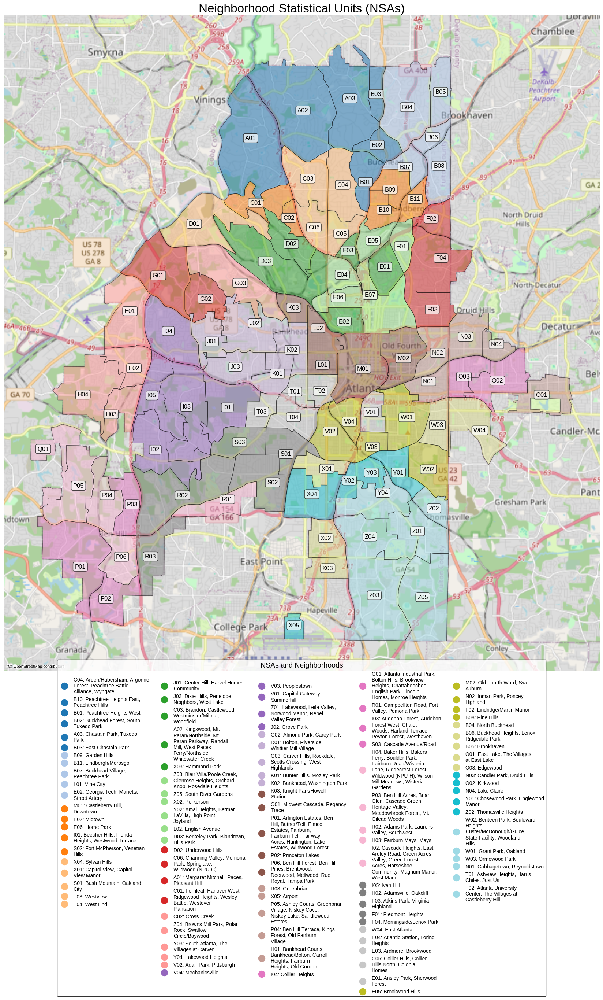

In [40]:
# Generate a custom colormap with enough unique colors
num_labels = len(nsa_gdf)  # Total number of neighborhoods
colors = cm.get_cmap('tab20', num_labels)  # Generate enough colors from the 'tab20' colormap

# Adjust figure size dynamically to accommodate larger font sizes
fig, ax = plt.subplots(figsize=(35, 30))  # Increase size for better layout with larger fonts

# Plot the NSA polygons with transparency
nsa_gdf.plot(
    ax=ax, 
    column='NSA', 
    cmap='tab20', 
    legend=False, 
    edgecolor='black', 
    alpha=0.5  # Set transparency for the base polygons
)

# Add `NSA` labels to the center of each polygon
for _, row in nsa_gdf.iterrows():
    # Use the representative point for better placement
    label_point = row.geometry.representative_point()
    
    # Add label text (NSA value) with a white outline
    ax.text(
        label_point.x, label_point.y, row['NSA'],  # Use the `NSA` column for labels
        fontsize=12, color='black', ha='center', va='center',  # Slightly larger font
        bbox=dict(
            boxstyle="round,pad=0.3",  # Rounded rectangle with padding
            edgecolor='black',  # Black outline
            facecolor='white',  # White background for better contrast
            alpha=0.7  # Slightly transparent
        )
    )

# Add a basemap for context
ctx.add_basemap(ax, crs=nsa_gdf.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)

# Customize the plot
ax.set_title("Neighborhood Statistical Units (NSAs)", fontsize=24)  # Larger title
ax.set_axis_off()

# Prepare legend labels with both `NSA` and `Neighborho` values
legend_labels = [
    f"{row['NSA']}: {textwrap.fill(row['Neighborho'], width=25)}"  # Adjust text wrapping width
    for _, row in nsa_gdf.iterrows()
]

# Create a dummy scatter plot for the legend (to match colors with NSA polygons)
handles = [
    plt.Line2D(
        [0], [0], 
        marker='o', color='w', 
        markerfacecolor=colors(i / num_labels), markersize=15,  # Increase marker size for readability
        label=label
    )
    for i, label in enumerate(legend_labels)
]

# Add a legend with both NSA and Neighborhood values
legend = ax.legend(
    handles=handles, 
    title="NSAs and Neighborhoods", 
    loc='lower center',  # Place the legend at the bottom center
    bbox_to_anchor=(0.5, -0.5),  # Push the legend further down to avoid overlap
    fontsize=10,  # Larger font size for legend text
    title_fontsize=14,  # Larger font size for legend title
    ncol=5  # Reduce the number of columns for better readability
)

# Adjust legend box appearance
legend.get_frame().set_alpha(0.8)  # Semi-transparent background
legend.get_frame().set_edgecolor('black')  # Black border

# Tighten layout to maximize space usage
plt.tight_layout()

# Show the plot
plt.show()

This shapefile doesn't include the Emory Annexation on the NE side, which I think happened in 2018 or 2019

## 4.5 Visualize NPUs

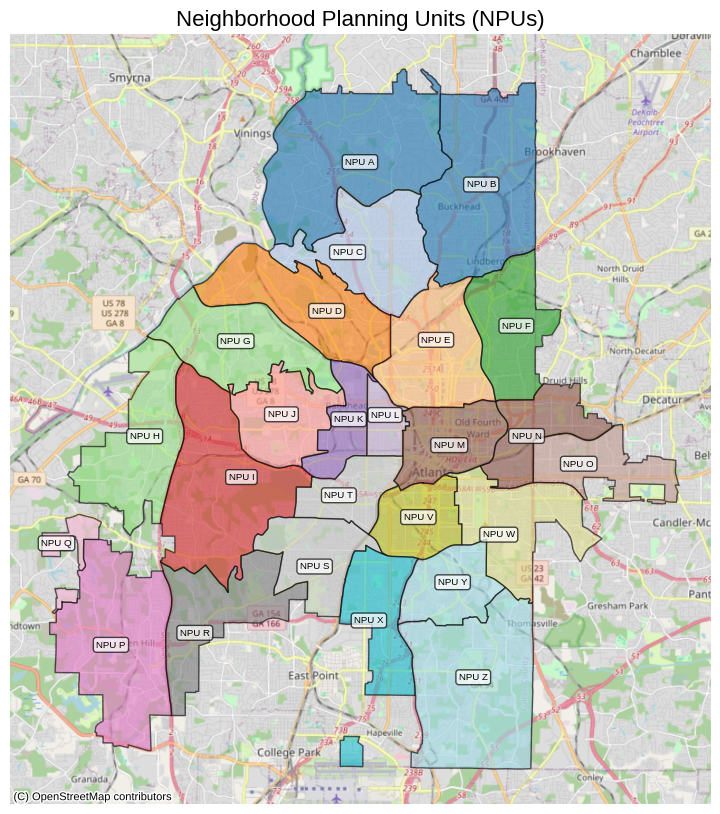

In [43]:
# Plot the NPU GeoDataFrame
fig, ax = plt.subplots(figsize=(10, 10))
npu_gdf.plot(
    ax=ax, 
    column='NPU', 
    cmap='tab20', 
    legend=False,  # Disable legend since labels are added on polygons
    edgecolor='black', 
    alpha=0.6  # Set transparency for polygons
)

# Add labels to the center of each polygon
for _, row in npu_gdf.iterrows():
    # Use the representative point for better placement
    label_point = row.geometry.representative_point()
    
    # Add text with a white outline
    ax.text(
        label_point.x, label_point.y, row['NPU'],  # Coordinates and label text
        fontsize=7, color='black', ha='center', va='center',
        bbox=dict(
            boxstyle="round,pad=0.3",  # Rounded rectangle with padding
            edgecolor='black',  # White outline
            facecolor='white',  # White background for better contrast
            alpha=0.7  # Slightly transparent
        )
    )

# Add a basemap for context
ctx.add_basemap(ax, crs=npu_gdf.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)

# Customize the plot
ax.set_title("Neighborhood Planning Units (NPUs)", fontsize=16)
ax.set_axis_off()

# Show the plot
plt.show()

## 4.6 Visualize City Council Districts

In [45]:
city_council_gdf.head()

,OBJECTID,LOCALID,NAME,GEOTYPE,FULLFIPS,LEGALAREA,EFFECTDATE,ENDDATE,SRCREF,ACRES,...,OLDNAME,NPU,CREATED_US,CREATED_DA,LAST_EDITE,LAST_EDI_1,GLOBALID,SHAPE_Area,SHAPE_Leng,geometry
0,276,NaN,2,City Council District,NaN,NaN,NaN,NaN,NaN,2794.84,...,NaN,NaN,NaN,NaN,SHENDERSON,2022-01-10,{E4EEE9DB-F90F-4607-A7C7-DEE87EDB641D},1.217428e+08,76893.116478,"POLYGON ((-84.38882 33.79168, -84.38827 33.791..."
1,278,NaN,8,City Council District,NaN,NaN,NaN,NaN,NaN,12108.02,...,NaN,NaN,NaN,NaN,SHENDERSON,2022-01-10,{ADE6D80F-3143-499A-AD0D-BEDC36ADDD3B},5.274231e+08,127054.447840,"POLYGON ((-84.38963 33.88308, -84.38953 33.882..."
2,279,NaN,9,City Council District,NaN,NaN,NaN,NaN,NaN,11413.01,...,NaN,NaN,NaN,NaN,SHENDERSON,2022-01-10,{0C1BF7DE-D33A-4D16-AB3E-B2784D684798},4.971488e+08,109906.894890,"POLYGON ((-84.44291 33.82635, -84.44271 33.826..."
3,281,NaN,7,City Council District,NaN,NaN,NaN,NaN,NaN,5069.26,...,NaN,NaN,NaN,NaN,SHENDERSON,2022-01-10,{B682D286-C684-46CE-A51B-3BFCF7055163},2.208161e+08,77603.412811,"POLYGON ((-84.34809 33.88203, -84.34810 33.881..."
4,282,NaN,3,City Council District,NaN,NaN,NaN,NaN,NaN,4804.59,...,NaN,NaN,NaN,NaN,SHENDERSON,2022-01-10,{2A786A97-7D11-45F5-898A-D33AD39E211B},2.092869e+08,90504.724600,"POLYGON ((-84.38776 33.79332, -84.38783 33.791..."


In [46]:
city_council_gdf.columns

Index(['OBJECTID', 'LOCALID', 'NAME', 'GEOTYPE', 'FULLFIPS', 'LEGALAREA',
       'EFFECTDATE', 'ENDDATE', 'SRCREF', 'ACRES', 'SQMILES', 'OLDNAME', 'NPU',
       'CREATED_US', 'CREATED_DA', 'LAST_EDITE', 'LAST_EDI_1', 'GLOBALID',
       'SHAPE_Area', 'SHAPE_Leng', 'geometry'],
      dtype='object')

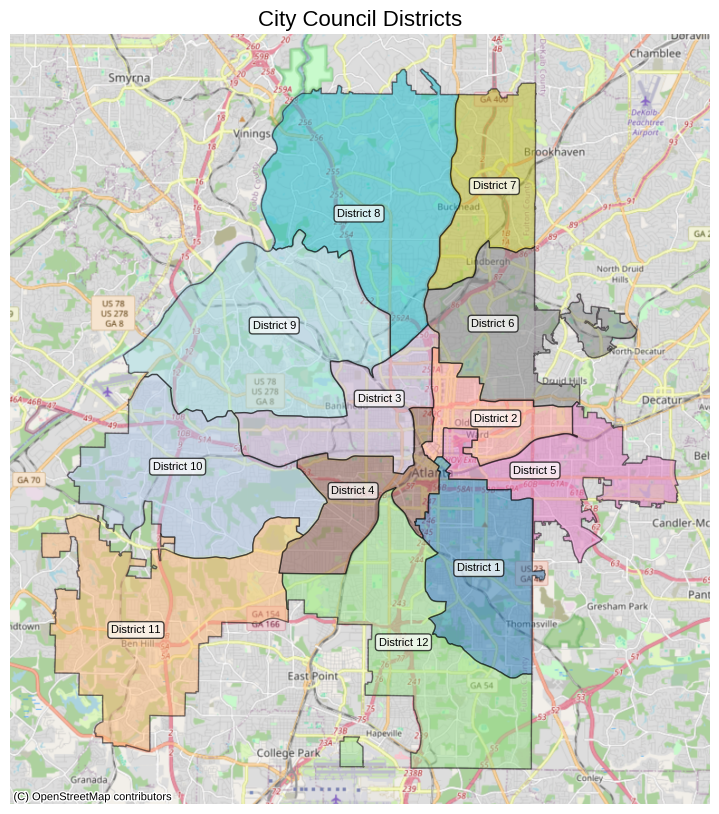

In [47]:
# Plot the City Council GeoDataFrame
fig, ax = plt.subplots(figsize=(10, 10))
city_council_gdf.plot(
    ax=ax, 
    column='NAME', 
    cmap='tab20', 
    legend=False, 
    edgecolor='black', 
    alpha=0.5  # Set transparency for polygons
)

# Add labels to the center of each polygon with manual adjustments for certain districts
for _, row in city_council_gdf.iterrows():
    # Use the representative point for better placement
    label_point = row.geometry.representative_point()
    
    # Adjust label placement for specific districts using the translate function
    if row['NAME'] == '5':
        label_point = translate(label_point, yoff=0.004)  # Move label slightly higher
    elif row['NAME'] == '2':
        label_point = translate(label_point, yoff=-0.004)  # Move label slightly lower
    elif row['NAME'] == '12':
        label_point = translate(label_point, yoff=-0.005)  # Move label slightly lower
    elif row['NAME'] == '3':
        label_point = translate(label_point, xoff=-0.004)  # Move label slightly to the left

    # Add text with the "District " prefix and a white outline
    ax.text(
        label_point.x, label_point.y, f"District {row['NAME']}",  # Add prefix dynamically
        fontsize=8, color='black', ha='center', va='center',
        bbox=dict(
            boxstyle="round,pad=0.3",  # Rounded rectangle with padding
            edgecolor='black',  # White outline
            facecolor='white',  # White background for better contrast
            alpha=0.7  # Slightly transparent
        )
    )

# Add a basemap for context
ctx.add_basemap(ax, crs=city_council_gdf.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)

# Customize the plot
ax.set_title("City Council Districts", fontsize=16)
ax.set_axis_off()

# Show the plot
plt.show()

# 4.7 Visualize Official City Quadrants

In [49]:
quad_gdf.head()

,OBJECTID,LOCALID,NAME,GEOTYPE,FULLFIPS,LEGALAREA,EFFECTDATE,ENDDATE,SRCREF,ACRES,...,OLDNAME,NPU,CREATED_US,CREATED_DA,LAST_EDITE,LAST_EDI_1,GLOBALID,Shape__Are,Shape__Len,geometry
0,5,NaN,NW,Quadrant,NaN,NaN,NaN,NaN,NaN,30635.44,...,NaN,NaN,COA_DCP_GIS,2023-03-15,COA_DCP_GIS,2023-03-15,d2991761-5224-47eb-9bc5-c920796de0ed,1.800665e+08,67605.648236,"POLYGON ((-84.38963 33.88308, -84.38953 33.882..."
1,6,NaN,SW,Quadrant,NaN,NaN,NaN,NaN,NaN,28512.83,...,NaN,NaN,COA_DCP_GIS,2023-03-15,COA_DCP_GIS,2023-03-15,1fa586a3-4dfc-4dca-ab4d-e31c25d035e6,1.655039e+08,118614.211956,"MULTIPOLYGON (((-84.42135 33.65888, -84.42090 ..."
2,650,NaN,SE,Quadrant,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,COA_DCP_GIS,2023-03-15,COA_DCP_GIS,2023-03-15,55eff0c1-50df-4206-9ee9-47f5d8bae882,7.615696e+07,65887.914823,"POLYGON ((-84.34953 33.71350, -84.34953 33.712..."
3,651,NaN,NE,Quadrant,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,COA_DCP_GIS,2023-03-15,COA_DCP_GIS,2023-03-15,37e8132e-98f1-499e-ab99-894cd0fe75b4,9.025904e+07,86136.401535,"POLYGON ((-84.34882 33.78758, -84.34883 33.786..."


In [50]:
quad_gdf.columns

Index(['OBJECTID', 'LOCALID', 'NAME', 'GEOTYPE', 'FULLFIPS', 'LEGALAREA',
       'EFFECTDATE', 'ENDDATE', 'SRCREF', 'ACRES', 'SQMILES', 'OLDNAME', 'NPU',
       'CREATED_US', 'CREATED_DA', 'LAST_EDITE', 'LAST_EDI_1', 'GLOBALID',
       'Shape__Are', 'Shape__Len', 'geometry'],
      dtype='object')

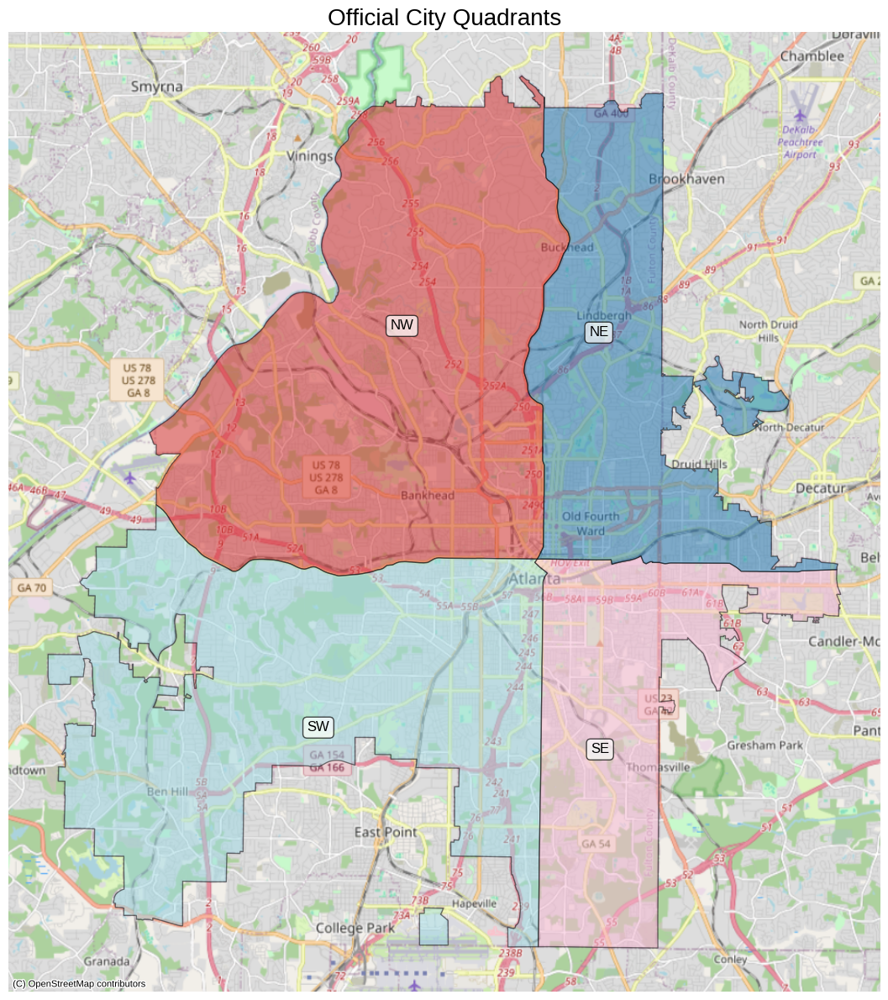

In [51]:
# Plot the City Quadrants GeoDataFrame
fig, ax = plt.subplots(figsize=(12, 12))

# Plot the quadrant polygons with transparency
quad_gdf.plot(
    ax=ax, 
    column='NAME',  # Color polygons based on the 'NAME' column
    cmap='tab20', 
    legend=False,  # Remove the legend since labels will be on the map
    edgecolor='black', 
    alpha=0.5  # Set transparency for the base polygons
)

# Add `NAME` labels to the center of each polygon
for _, row in quad_gdf.iterrows():
    # Use the representative point for better placement
    label_point = row.geometry.representative_point()
    
    # Add label text (NAME value) with a white outline
    ax.text(
        label_point.x, label_point.y, row['NAME'],  # Use the `NAME` column for labels
        fontsize=12, color='black', ha='center', va='center',  # Adjust font size
        bbox=dict(
            boxstyle="round,pad=0.3",  # Rounded rectangle with padding
            edgecolor='black',  # Black outline
            facecolor='white',  # White background for better contrast
            alpha=0.7  # Slightly transparent
        )
    )

# Add a basemap for context
ctx.add_basemap(ax, crs=quad_gdf.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)

# Customize the plot
ax.set_title("Official City Quadrants", fontsize=20)  # Adjust the title size
ax.set_axis_off()  # Remove axis lines and labels

# Show the plot
plt.tight_layout()  # Adjust layout to fit everything properly
plt.show()

## 5. Interactive HTML Visualization of Grocer Distribution for Multiple Geometries

In [53]:
# Ensure `stores_gdf` is defined from `subset_stores`
stores_gdf = gpd.GeoDataFrame(subset_stores, geometry=subset_stores['geometry'])
stores_gdf = stores_gdf.set_crs(npu_gdf.crs)  # Ensure CRS matches the polygon GeoDataFrames

# Convert polygon GeoDataFrames to GeoJSON
def gdf_to_geojson(gdf, properties):
    """Convert GeoDataFrame to GeoJSON with specific properties."""
    geojson = gdf.to_crs("EPSG:4326").__geo_interface__
    for feature, row in zip(geojson['features'], gdf.to_dict('records')):
        feature['properties'] = {prop: row[prop] for prop in properties}
    return geojson

def add_legend_and_source(folium_map, colormap, polygon_name):
    # Custom Legend Box (with embedded density scale)
    legend_html = f"""
    <div style="position: fixed; 
                bottom: 30px; left: 30px; 
                width: 280px; 
                background-color: white; 
                z-index: 9999; 
                font-size: 14px; 
                padding: 10px; 
                border-radius: 5px; 
                box-shadow: 2px 2px 5px rgba(0,0,0,0.4);">

        <b>Grocers by {polygon_name} in Atlanta, Georgia</b><br>
        <small>Polygons represent store density per area. Store data obtained using Open Street Map, which relies on volunteer contributions.</small><br><br>
        <small>
            If a grocer needs to be added, removed, or modified, please submit details 
            <a href="https://forms.gle/7R213wPQbYZqCJ6w6" target="_blank" style="color: #0077b6; text-decoration: none;">
                here
            </a> 
            for consideration. Categorization is subjective and done by yours truly, with the main criteria of being a grocer being that they carry fresh fruit or vegetables.
        </small><br><br>

        <i class="fa fa-shopping-cart fa-lg" style="color:black"></i> Specialty Market<br>
        <i class="fa fa-shopping-cart fa-lg" style="color:blue"></i> Local Market<br>
        <i class="fa fa-shopping-cart fa-lg" style="color:orange"></i> Big Box or Chain Grocer<br><br>

        <b>Grocer Density Scale:</b><br>

        <!-- Embedded Color Scale with Adjustments -->
        <div style="width: 240px; height: 15px; background: linear-gradient(to right, #e5f5e0, #31a354); border: 1px solid black; margin-top: 5px;"></div>
        <div style="display: flex; justify-content: space-between; font-size: 12px; margin-top: 2px;">
            <span>{int(colormap.vmin)}</span>
            <span>{int((colormap.vmin + colormap.vmax) / 2)}</span>
            <span>{int(colormap.vmax)}</span>
        </div>
    </div>
    """

    folium_map.get_root().html.add_child(folium.Element(legend_html))

    # Source Attribution
    source_html = """
    <div style="position: fixed; 
                bottom: 5px; left: 30px; 
                background-color: rgba(255, 255, 255, 0.9); 
                z-index: 9999; 
                font-size: 12px; 
                padding: 5px; 
                border-radius: 3px;">
        <b>Source:</b> Daniel Krasner (they/them/theirs) | 
        <a href="https://www.instagram.com/data.urbanist" target="_blank" 
           style="color: #0077b6; text-decoration: none;">@data.urbanist</a> on Instagram
    </div>
    """
    folium_map.get_root().html.add_child(folium.Element(source_html))

# Updated create_interactive_map_with_custom_popups function
def create_interactive_map_with_custom_popups(
    polygon_gdf, polygon_name, properties, value_column, output_file, nsa_gdf=None
):
    # Ensure the grocery stores are spatially joined to calculate store count
    joined_gdf = gpd.sjoin(stores_gdf, polygon_gdf, how='inner', predicate='within')
    store_counts = joined_gdf.groupby('index_right').size()  # Count stores within each polygon
    polygon_gdf[value_column] = polygon_gdf.index.map(store_counts).fillna(0).astype(int)  # Map counts to polygons

    # Handle custom labels for columns
    additional_properties = {
        'NPU': 'NPU:',
        'Neighborhoods': 'Neighborhoods:',  # Ensure the colon is consistent
        'NAME': 'City Council District:' if polygon_name == "City Council Districts" else "City Quadrant:",
        'store_count': 'Number of Grocers:'
    }

    # Adjust `Neighborho` to list neighborhoods for NPUs
    if nsa_gdf is not None and 'NPU' in polygon_gdf.columns:
        if 'Neighborhoods' not in polygon_gdf.columns:  # Only add if not already present
            polygon_gdf['Neighborhoods'] = polygon_gdf['NPU'].apply(
                lambda npu: ', '.join(sorted(set(nsa_gdf.loc[nsa_gdf['NPU'] == npu, 'Neighborho'])))
            )
        properties = [prop if prop != 'Neighborho' else 'Neighborhoods' for prop in properties]  # Replace `Neighborho` with `Neighborhoods`

    # Center the map on Atlanta
    atlanta_center = [33.7490, -84.3880]
    folium_map = folium.Map(location=atlanta_center, zoom_start=12)

    # Create a continuous color scale for the `value_column`
    min_value, max_value = polygon_gdf[value_column].min(), polygon_gdf[value_column].max()
    colormap = linear.Greens_09.scale(min_value, max_value)

    # Add polygons with the continuous color scale
    geojson = gdf_to_geojson(polygon_gdf, properties + [value_column])
    folium.GeoJson(
        geojson,
        name=polygon_name,
        tooltip=folium.GeoJsonTooltip(
            fields=properties + [value_column],
            aliases=[additional_properties.get(p, p) for p in properties + [value_column]],  # Use alternative names
            style=(
                "background-color: white; color: black; font-size: 14px; "
                "padding: 10px; white-space: normal; line-height: 1.4;"
            )  # Basic styles; max-width will be set in CSS override
        ),
        style_function=lambda feature: {
            'fillColor': colormap(float(feature['properties'][value_column])),  # Ensure value is float
            'color': 'black',
            'weight': 1,
            'fillOpacity': 0.6,
        }
    ).add_to(folium_map)

    # Add grocery store markers with color-coded categories and styled popups
    for idx, row in stores_gdf.iterrows():
        # Determine the color based on the store category
        category = row['category']
        color = 'gray'  # Default color for uncategorized stores
        for cat, details in store_categories.items():
            if category == cat:
                color = details['color']
                break

        # Create an HTML popup with field names in bold
        popup_html = f"""
        <div style="
            background-color: white; 
            padding: 10px; 
            border-radius: 5px; 
            box-shadow: 2px 2px 5px rgba(0,0,0,0.3); 
            max-width: 300px;">
            <b>Store:</b> {row['name']}<br>
            <b>Category:</b> {row['category']}
        </div>
        """

        # Add the marker with the custom HTML popup
        folium.Marker(
            location=[row.geometry.y, row.geometry.x],
            popup=folium.Popup(popup_html, max_width=300),  # Set a max width for consistency
            icon=folium.Icon(color=color, icon='shopping-cart')
        ).add_to(folium_map)

    # Add Legend and Source INSIDE the function
    add_legend_and_source(folium_map, colormap, polygon_name)
    
    # Save the map
    folium_map.save(output_file)
    print(f"Interactive map saved as {output_file}")

    # Inject custom CSS for wider tooltips
    tooltip_css = """
    <style>
        .leaflet-tooltip-pane .leaflet-tooltip {
            max-width: 2000px !important; /* Set maximum width */
            word-wrap: break-word;      /* Ensure long words wrap */
        }
    </style>
    """

    css_element = MacroElement()
    css_element._template = Element(tooltip_css)
    folium_map.get_root().add_child(css_element)    
    
# Create maps with updated popups
create_interactive_map_with_custom_popups(
    npu_gdf.copy(), "Neighborhood Planning Units (NPUs)", ['NPU', 'Neighborho'], 'store_count',
    "npu_custom_popup_map.html", nsa_gdf=nsa_gdf
)
create_interactive_map_with_custom_popups(
    city_council_gdf.copy(), "City Council Districts", ['NAME'], 'store_count',
    "city_council_custom_popup_map.html"
)
create_interactive_map_with_custom_popups(
    quad_gdf.copy(), "City Quadrants", ['NAME'], 'store_count',
    "quadrants_custom_popup_map.html"
)

Interactive map saved as npu_custom_popup_map.html
Interactive map saved as city_council_custom_popup_map.html
Interactive map saved as quadrants_custom_popup_map.html
